In [5]:
#basic imports 
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix


In [38]:
#data aquisition
wine_df = pd.read_csv("winequalityN.csv")

In [3]:
wine_df.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [4]:
wine_df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6487.000000,6489.000000,6494.000000,6495.000000,6495.000000,6497.000000,6497.000000,6497.000000,6488.000000,6493.000000,6497.000000,6497.000000
mean,7.216579,0.339691,0.318722,5.444326,0.056042,30.525319,115.744574,0.994697,3.218395,0.531215,10.491801,5.818378
std,1.296750,0.164649,0.145265,4.758125,0.035036,17.749400,56.521855,0.002999,0.160748,0.148814,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


In [6]:
wine_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  6497 non-null   object 
 1   fixed acidity         6487 non-null   float64
 2   volatile acidity      6489 non-null   float64
 3   citric acid           6494 non-null   float64
 4   residual sugar        6495 non-null   float64
 5   chlorides             6495 non-null   float64
 6   free sulfur dioxide   6497 non-null   float64
 7   total sulfur dioxide  6497 non-null   float64
 8   density               6497 non-null   float64
 9   pH                    6488 non-null   float64
 10  sulphates             6493 non-null   float64
 11  alcohol               6497 non-null   float64
 12  quality               6497 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


In [3]:
#report 
from ydata_profiling import ProfileReport
report = ProfileReport(wine_df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<Axes: xlabel='quality', ylabel='count'>

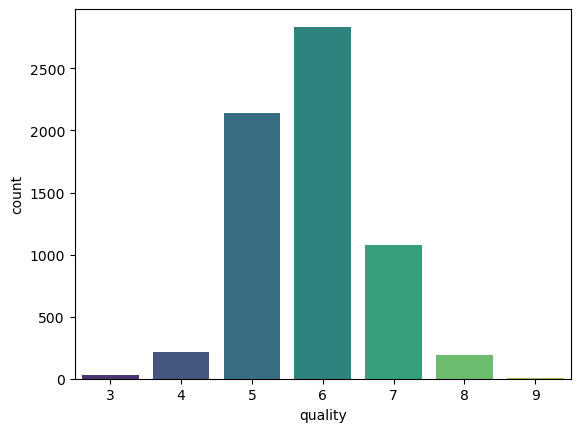

In [19]:
#target class
sns.countplot(data = wine_df,x='quality',palette='viridis')

<Axes: xlabel='type', ylabel='count'>

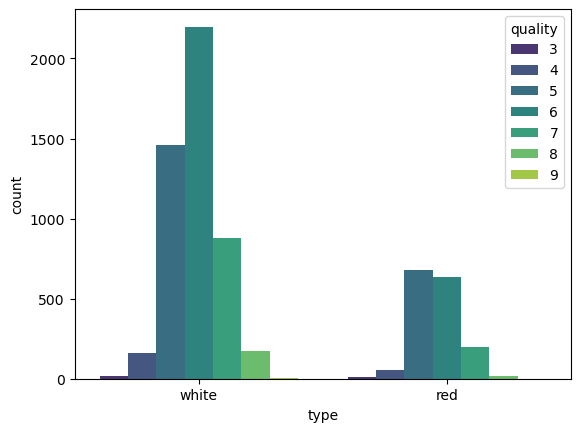

In [20]:
sns.countplot(data=wine_df,x='type',hue='quality',palette='viridis')

In [39]:
wine_df = pd.get_dummies(wine_df,['type'],drop_first=True)

<Axes: >

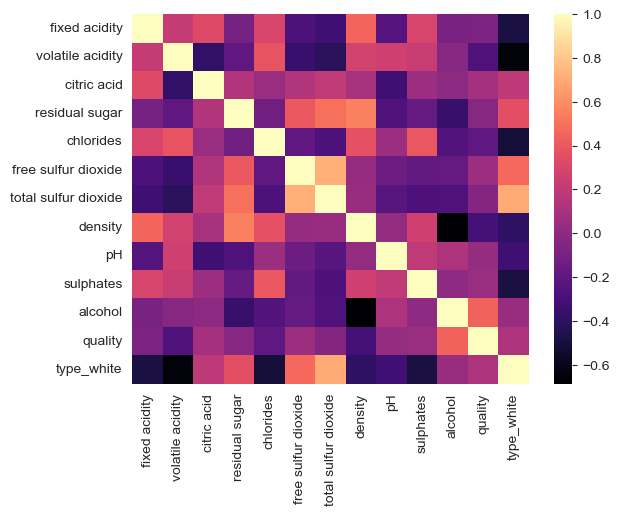

In [37]:
sns.heatmap(wine_df.corr(),cmap='magma')
#quality is positively correlated with alcohol and negatively correlated with density and volatile acidity

<Axes: xlabel='quality', ylabel='alcohol'>

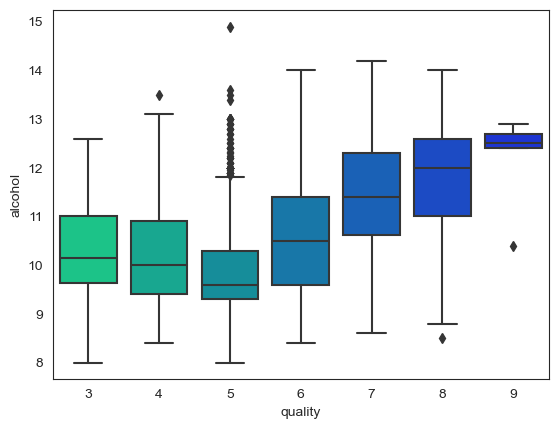

In [56]:
sns.set_style('white')
sns.boxplot(x='quality',y='alcohol',data=wine_df,palette='winter_r')

C:\Users\dines\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


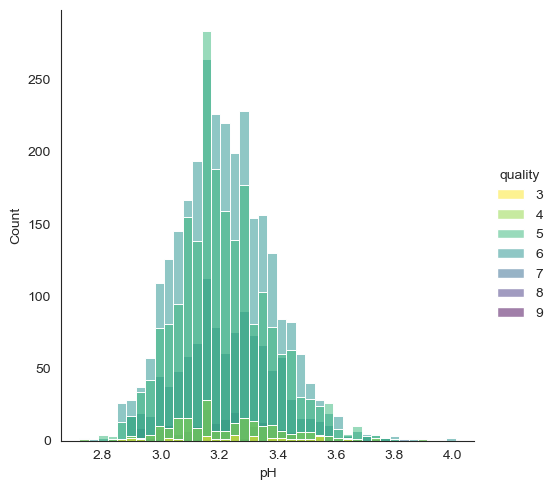

In [61]:
sns.displot(x='pH',data=wine_df,hue='quality',palette='viridis_r',alpha=0.5,bins=40)

C:\Users\dines\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


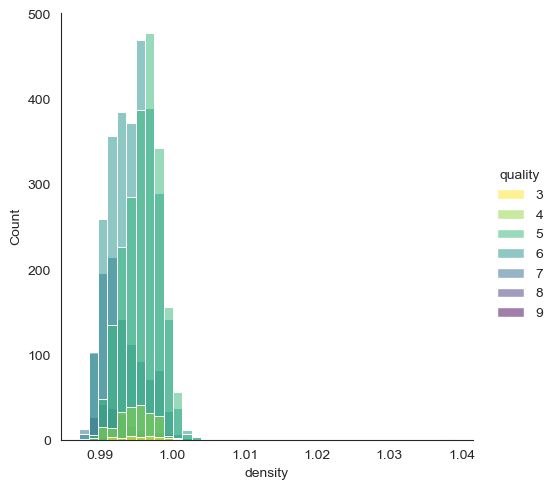

In [63]:
sns.displot(x='density',data=wine_df,hue='quality',palette='viridis_r',alpha=0.5,bins=40)

In [40]:
columns_to_fill = [
    'fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality', 'type_white'
]

# Replace null values in specified columns with their respective means
for column in columns_to_fill:
    mean_value = wine_df[column].mean()
    wine_df[column].fillna(mean_value, inplace=True)

In [53]:
X = wine_df.drop('quality',axis=1)
y = wine_df['quality']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3)


In [42]:
#preprocessing
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [9]:
#models - 1.Dtree, 2.Rfc, 3.SVM, 4.logistic
#model 1
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier()
dtree.fit(X_train,y_train)
pred_dtree = dtree.predict(X_test)
print(confusion_matrix(y_test,pred_dtree))
print(classification_report(y_test,pred_dtree))

[[  0   1   6   3   0   0   0]
 [  1  13  40  19   2   1   0]
 [  1  16 376 170  29   6   0]
 [  3  26 203 511 121  14   1]
 [  1   3  37 116 163  10   0]
 [  0   0   5  18  11  23   0]
 [  0   0   0   0   0   0   0]]
              precision    recall  f1-score   support

           3       0.00      0.00      0.00        10
           4       0.22      0.17      0.19        76
           5       0.56      0.63      0.59       598
           6       0.61      0.58      0.60       879
           7       0.50      0.49      0.50       330
           8       0.43      0.40      0.41        57
           9       0.00      0.00      0.00         0

    accuracy                           0.56      1950
   macro avg       0.33      0.33      0.33      1950
weighted avg       0.55      0.56      0.55      1950



C:\Users\dines\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\dines\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\dines\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [10]:
#hypertuning dtree model
#tuning
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
# Define the hyperparameter grid for RandomizedSearchCV
random_param_grid = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': np.arange(3, 15),
    'min_samples_split': np.arange(2, 11),
    'min_samples_leaf': np.arange(1, 6),
    'max_features': ['auto', 'sqrt', 'log2', None]
}

# Define the hyperparameter grid for GridSearchCV
grid_param_grid = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': np.arange(3, 15),
    'min_samples_split': np.arange(2, 11),
    'min_samples_leaf': np.arange(1, 6),
    'max_features': ['auto', 'sqrt', 'log2', None]
}
grid = GridSearchCV(dtree,grid_param_grid,verbose=3,cv=5)
rand_grid = RandomizedSearchCV(dtree,random_param_grid,n_iter=50,verbose=3,)
grid.fit(X_train,y_train)
rand_grid.fit(X_train,y_train)

Fitting 5 folds for each of 8640 candidates, totalling 43200 fits
[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_feat

[CV 2/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter

[CV 3/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=b

[CV 5/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=rando

[CV 4/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=10, s

[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.449 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.475 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.513 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.516 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.473 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.482 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split

[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.452 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.516 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.502 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.488 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.476 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.504 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, sp

[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.458 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.476 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.489 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.452 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.471 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.466 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split

[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.554 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.432 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.451 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.444 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.466 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.502 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_spl

[CV 3/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.459 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.515 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.507 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.510 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.487 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.431 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=7

[CV 1/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.519 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.486 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.503 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.518 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.558 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.433 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=7, sp

[CV 1/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.529 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.454 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.490 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.486 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.495 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.434 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=6, sp

[CV 5/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.514 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.488 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.445 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.485 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.475 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.451 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_spl

[CV 5/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.437 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.440 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.491 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.442 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.465 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.484 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=5, sp

[CV 2/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.477 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.513 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.455 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.501 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.452 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.437 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=4, 

[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.548 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.538 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.513 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.520 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.553 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.503 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=3, sp

[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.548 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.538 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.513 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.520 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.553 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.456 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split

[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.538 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.513 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.520 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.553 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.515 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.499 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=9, 

[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.538 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.513 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.520 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.553 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.508 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.518 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=7, 

[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.553 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.497 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.499 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.493 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.493 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_spl

[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.513 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.520 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.553 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.490 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.514 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.485 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=3

[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.538 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.513 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.520 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.553 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.467 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.467 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_spl

[CV 3/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitt

[CV 5/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=rando

[CV 2/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=ran

[CV 5/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitt

[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.469 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.498 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.446 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.466 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.457 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.541 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.531 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.466 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.516 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.485 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.460 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split

[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.518 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.540 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.505 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.502 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.441 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.498 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split

[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.480 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.487 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.464 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.492 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.504 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.441 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, sp

[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.503 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.479 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.464 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.520 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.493 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.493 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_spl

[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.474 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.497 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.539 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.518 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.510 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.497 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=3

[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.475 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.528 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.457 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.466 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.426 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.465 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples

[CV 1/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.482 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.460 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.529 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.510 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.556 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.449 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=9, sp

[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.508 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.487 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.469 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.524 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.519 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.503 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=8

[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.493 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.536 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.463 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.505 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.483 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.480 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split

[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.481 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.517 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.512 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.477 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.462 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.429 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=4

[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.432 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.457 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.491 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.519 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.519 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.479 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=3, 

[CV 2/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.458 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.497 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.476 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.431 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.556 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.520 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_s

[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.527 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.551 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.527 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.508 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.459 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.512 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split

[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.527 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.551 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.521 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.513 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.474 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.518 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split

[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.520 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.527 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.551 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.529 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.495 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.507 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_s

[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.520 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.527 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.551 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.509 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.523 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.484 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=7

[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.551 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.484 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.525 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.521 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.527 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.504 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_spl

[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.551 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.516 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.518 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.509 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.477 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.532 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_spl

[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.551 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.551 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.496 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.495 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.483 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.538 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_spl

[CV 2/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=ran

[CV 3/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=r

[CV 5/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitt

[CV 3/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=b

[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.473 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.531 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.504 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.524 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.475 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.495 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, 

[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.503 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.477 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.524 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.515 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.454 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.462 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, 

[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.437 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.486 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.487 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.516 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.516 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.508 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split

[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.500 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.463 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.450 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.439 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.486 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.490 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_sp

[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.437 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.513 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.503 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.527 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.505 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.517 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, 

[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.460 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.473 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.535 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.508 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.514 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.474 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, 

[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.462 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.468 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.483 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.462 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.525 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.535 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split

[CV 1/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.546 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.538 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.493 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.520 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.539 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.507 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2, sp

[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.519 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.499 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.493 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.542 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.501 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.464 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=9, 

[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.447 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.427 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.493 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.520 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.444 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.502 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split

[CV 5/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.528 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.463 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.470 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.458 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.461 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.480 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_spl

[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.460 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.502 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.519 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.524 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.490 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.448 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=3, 

[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.516 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.517 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.509 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.524 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.480 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.478 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_spl

[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.540 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.566 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.532 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.517 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.535 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=8, sp

[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.566 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.532 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.517 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.534 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.533 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, sp

[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.503 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.496 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.507 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.519 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.514 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_spl

[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.532 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.518 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.535 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.538 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.505 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=9, 

[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.517 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.534 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.534 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.507 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.497 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=6

[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.566 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.532 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.518 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.530 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.493 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=4, sp

[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.530 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.519 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.512 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.505 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.515 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples

[CV 4/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=b

[CV 5/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=rando

[CV 1/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=rando

[CV 1/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.502 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=2,

[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.446 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.449 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.503 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.534 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.487 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, 

[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.543 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.557 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.527 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.479 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.463 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.497 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split

[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.523 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.527 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.521 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.487 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.510 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.460 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split

[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.496 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.460 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.484 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.430 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.487 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.486 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_sample

[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.549 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.507 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.424 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.454 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.479 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.512 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.505 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.452 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.496 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.479 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.470 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.481 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.533 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.522 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.504 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.512 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.558 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.458 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=2, sp

[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.510 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.542 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.525 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.470 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.468 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.484 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8

[CV 5/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.473 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.511 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.516 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.531 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.541 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.537 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, sp

[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.521 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.491 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.532 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.491 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.463 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.477 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=3

[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.520 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.480 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.505 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.536 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.571 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.444 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=9, sp

[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.509 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.551 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.561 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.502 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.475 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, 

[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.525 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.503 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.490 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.512 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.526 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.501 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=4, sp

[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.513 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.564 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.468 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.489 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.492 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.462 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples

[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.568 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.536 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.512 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.548 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.554 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.520 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=8, sp

[CV 5/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.554 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.501 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.511 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.534 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.514 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.534 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.567 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.536 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.512 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.547 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.554 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.507 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=3, sp

[CV 5/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.554 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.500 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.504 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.519 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.485 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.504 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.566 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.535 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.512 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.548 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.557 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.529 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=6, sp

[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.529 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.505 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.506 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.526 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.503 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.565 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_spl

[CV 5/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.535 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.565 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.527 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.514 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.541 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.556 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=

[CV 3/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=b

[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=2, 

[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter

[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.549 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.458 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.473 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.450 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.476 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.524 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.540 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.532 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.503 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.546 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.552 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.469 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, sp

[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.538 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.519 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.546 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.495 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.453 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, 

[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.466 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.430 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.499 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.471 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.533 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.499 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split

[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.526 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.457 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.491 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.502 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.522 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.511 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split

[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.543 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.455 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.468 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.468 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.495 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.502 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_spl

[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.530 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.564 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.497 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.515 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.436 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.496 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split

[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.530 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.523 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.537 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.573 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.480 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, sp

[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.525 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.555 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.504 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.510 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split

[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.535 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.498 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.467 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.474 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.505 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.483 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_spl

[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.540 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.508 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.477 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.496 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.475 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.547 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.548 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.519 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.482 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.523 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.535 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.536 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=5, sp

[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.460 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.487 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.503 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.480 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.538 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.527 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_sample

[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.491 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.515 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.549 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.502 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.485 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.470 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=7

[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.558 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.558 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.538 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.545 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.558 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=4, sp

[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.558 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.530 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.521 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.508 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.535 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_sampl

[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.546 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.558 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.527 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.499 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.529 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.534 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split

[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.543 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.513 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.500 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.525 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=4

[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.537 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.543 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.509 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.529 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_spl

[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.526 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.546 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.549 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.551 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.537 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.514 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=7

[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.547 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.536 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.525 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.537 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.549 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.532 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=4, sp

[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.549 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.540 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.525 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.538 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.525 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split

[CV 4/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter

[CV 3/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=b

[CV 5/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter

[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.520 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.505 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.503 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.556 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.527 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.478 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, sp

[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.463 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.506 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.499 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.538 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.559 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.508 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=6

[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.545 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.460 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.497 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.508 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.503 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split

[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.520 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.532 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.527 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.547 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.465 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, sp

[CV 5/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.545 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.518 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.504 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.444 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.481 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.457 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_sampl

[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.517 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.528 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.490 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.495 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.430 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7

[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.549 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.560 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.520 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.526 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.562 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.485 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=6, sp

[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.495 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.480 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.501 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.481 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.511 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.510 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split

[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.528 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.567 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.480 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.480 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.506 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.460 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples

[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.508 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.524 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.548 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.492 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.443 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.472 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=7

[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.527 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.477 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.481 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.452 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.503 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.490 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_spl

[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.535 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.554 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.497 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.481 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.480 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.521 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split

[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.507 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.525 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.510 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.520 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.556 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.507 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, sp

[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.557 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.570 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.566 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.526 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.521 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.532 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split

[CV 1/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.526 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.525 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.513 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.525 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.516 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.574 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_spl

[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.567 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.525 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.512 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.518 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.537 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.564 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_spl

[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.571 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.513 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.557 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.516 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.521 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.539 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_spl

[CV 3/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.531 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.506 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.542 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.569 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.569 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.529 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=3

[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.537 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.526 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.568 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.566 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.534 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.553 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=9, 

[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.545 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.585 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.519 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.501 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.536 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.495 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split

[CV 3/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=r

[CV 2/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=10, split

[CV 3/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitter=b

[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.555 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.525 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.564 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.457 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.489 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, 

[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.535 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.518 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.518 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.547 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.502 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.504 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_spl

[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.509 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.565 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.553 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.526 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.484 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.493 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=8

[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.560 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.544 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.501 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.548 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.563 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.444 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, sp

[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.545 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.510 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.532 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.545 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.541 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.498 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, 

[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.506 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.493 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.539 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.504 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.538 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.501 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=4

[CV 4/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.536 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.545 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.468 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.486 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.447 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.474 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split

[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.534 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.490 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.543 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.541 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.512 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.489 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=9, 

[CV 5/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.520 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.445 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.481 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.501 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.472 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.519 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.536 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.523 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.514 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.519 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.538 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.519 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=6, sp

[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.522 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.512 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.512 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.549 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.507 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.499 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=4, 

[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.507 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.471 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.526 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.535 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.532 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.532 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=3

[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.518 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.441 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.493 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.475 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.546 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.574 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_s

[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.531 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.554 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.585 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.535 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.540 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.493 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=7

[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.507 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.536 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.544 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.570 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.561 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=4, 

[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.553 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.581 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.474 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.497 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.530 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.567 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split

[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.537 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.576 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.536 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.551 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.579 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.547 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=6, sp

[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.528 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.551 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.580 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.508 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.519 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=3

[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.535 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.578 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.535 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.549 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.582 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.518 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=9, sp

[CV 5/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.582 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.514 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.508 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.528 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.542 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.527 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_spl

[CV 3/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=3, spl

[CV 5/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitte

[CV 5/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=5,

[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.549 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.549 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.534 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.517 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.560 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.496 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_spli

[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.544 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.494 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.548 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.534 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.489 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.481 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_sp

[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.526 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.559 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.512 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.462 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.490 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.473 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_sample

[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.537 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.522 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.478 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.515 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.498 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.495 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samp

[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.533 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.500 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.491 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.498 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.502 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.530 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samp

[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.545 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.567 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.470 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.477 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.477 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.505 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_sample

[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.535 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.580 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.500 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.511 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.470 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.496 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_sample

[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.504 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.562 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.565 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.525 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.502 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.493 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_

[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.520 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.523 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.543 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.530 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.538 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.547 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_spli

[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.591 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.542 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.479 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.507 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.497 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.477 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samp

[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.462 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.485 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.482 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.485 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.556 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.531 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samp

[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.476 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.551 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.529 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.496 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.551 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.531 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_spli

[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.486 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.538 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.493 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.521 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.575 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.501 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_spli

[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.520 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.494 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.508 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.531 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.499 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.431 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samp

[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.570 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.531 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.551 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.579 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.531 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.530 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_sp

[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.528 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.558 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.565 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.551 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.521 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.503 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_

[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.521 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.538 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.549 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.543 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.570 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.531 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_sampl

[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.550 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.572 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.536 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.554 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.524 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.534 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_sample

[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.529 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.548 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.583 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.537 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.527 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.538 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_

[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.535 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.543 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.587 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.536 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.505 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.516 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_

[CV 1/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.543 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.565 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.534 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.545 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.589 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.533 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_spli

[CV 1/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=3,

[CV 4/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=6, s

[CV 1/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=3,

[CV 3/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=8, spl

[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.524 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.539 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.552 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.522 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.471 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.465 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_

[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.522 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.536 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.513 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.556 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.570 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.466 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_spli

[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.511 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.497 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.486 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.527 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.574 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.545 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samp

[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.549 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.536 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.561 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.509 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.492 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_sp

[CV 5/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.548 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.529 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.471 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.493 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.472 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.552 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samp

[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.527 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.535 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.510 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.537 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.558 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.489 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_spli

[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.482 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.488 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.487 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.524 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.526 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.501 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_

[CV 4/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.539 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.540 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.478 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.496 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.497 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.519 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_sample

[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.521 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.523 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.537 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.550 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.549 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.538 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_spli

[CV 1/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.530 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.541 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.528 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.546 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.560 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.520 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_spli

[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.516 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.524 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.518 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.529 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.503 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.528 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_spli

[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.558 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.484 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.505 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.513 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.484 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.525 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samp

[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.520 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.495 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.529 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.547 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.507 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.533 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_sp

[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.501 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.512 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.503 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.554 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.581 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.531 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_sampl

[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.547 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.540 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.584 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.546 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.567 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.530 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_

[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.543 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.572 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.545 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.570 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.567 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_sp

[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.557 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.579 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.542 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.513 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.503 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.509 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_

[CV 1/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.546 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.567 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.528 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.554 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.585 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.529 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_spli

[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.578 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.530 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.541 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.585 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.497 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.508 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_sp

[CV 1/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.542 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.578 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.545 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.537 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.586 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.536 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_sample

[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.541 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.543 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.585 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.544 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.533 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.526 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_

[CV 3/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=2, 

[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=5, split

[CV 2/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=8, s

[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=10, 

[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.508 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.536 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.530 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.534 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.552 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.581 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_spli

[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.517 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.520 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.560 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.493 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.504 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.493 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_

[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.463 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.494 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.475 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.519 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.564 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.526 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_

[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.536 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.546 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.496 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.508 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.494 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.512 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_sample

[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.534 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.556 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.545 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.512 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.468 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.488 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_

[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.516 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.499 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.543 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.507 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.486 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.483 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_

[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.492 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.528 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.531 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.547 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.558 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_sampl

[CV 4/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.502 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.536 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.549 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.530 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.518 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.520 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_sp

[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.549 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.553 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.530 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.525 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.574 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.515 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_spli

[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.525 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.565 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.563 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.529 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.520 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.492 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_

[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.509 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.519 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.520 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.535 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.547 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.545 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_spli

[CV 5/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.536 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.511 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.497 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.475 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.504 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.551 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samp

[CV 5/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.524 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.502 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.531 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.505 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.535 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.558 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_spli

[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.540 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.536 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.514 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.520 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.549 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.490 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_sample

[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.574 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.536 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.553 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.579 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.544 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.523 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.567 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.552 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.561 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.501 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.571 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_sp

[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.543 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.547 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.565 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.527 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.535 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.521 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_sa

[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.537 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.553 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.565 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.554 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.526 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.526 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_

[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.535 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.535 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.571 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.505 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.543 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_

[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.540 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.538 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.573 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.505 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.514 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.517 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_sa

[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.543 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.538 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.581 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.514 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.521 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.532 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_

[CV 5/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=10, s

[CV 3/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=3, spl

[CV 5/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=7,

[CV 2/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=9, split

[CV 4/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.507 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.536 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.548 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.545 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.526 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.545 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_sp

[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.565 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.490 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.522 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.497 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.513 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.507 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samp

[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.557 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.526 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.492 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.493 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.509 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samp

[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.549 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.459 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.493 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.486 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.498 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.528 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samp

[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.502 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.503 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.515 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.562 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.536 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.557 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_sample

[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.545 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.516 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.551 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.553 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.512 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.464 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_sp

[CV 4/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.514 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.548 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.501 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.431 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.430 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.472 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_sample

[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.572 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.481 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.516 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.497 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.530 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.542 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samp

[CV 4/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.540 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.578 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.514 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.532 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.487 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.509 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_sample

[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.536 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.541 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.547 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.504 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.488 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.491 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_

[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.572 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.510 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.491 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.507 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.502 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.537 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samp

[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.474 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.473 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.471 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.528 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.518 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.529 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samp

[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.523 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.506 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.528 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.557 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.535 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.497 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.522 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.496 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.517 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.568 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.508 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.521 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_sample

[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.581 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.586 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.543 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.558 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.571 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.536 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_spli

[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.573 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.532 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.548 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.575 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.505 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.541 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_sp

[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.562 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.578 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.516 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.538 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.569 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.516 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_spli

[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.510 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.541 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.564 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.489 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.519 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.501 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_

[CV 5/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.532 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.558 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.568 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.524 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.539 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.574 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_spli

[CV 5/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.580 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.511 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.512 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.534 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.534 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.542 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samp

[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.543 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.580 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.530 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.534 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.579 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.524 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_sample

[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.554 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.559 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.539 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.529 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.576 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.540 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_spli

[CV 4/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=5, s

[CV 3/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=8, spl

[CV 4/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_spli

[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.552 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.538 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.605 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.507 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.562 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_sp

[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.496 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.520 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.543 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.542 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.532 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.534 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_sp

[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.521 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.512 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.481 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.493 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.524 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.536 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samp

[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.573 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.471 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.431 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.496 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.529 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.529 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samp

[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.558 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.541 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.487 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.486 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.508 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.508 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_sample

[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.475 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.444 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.499 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.448 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.507 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.565 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samp

[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.526 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.559 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.543 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.552 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.519 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_spli

[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.549 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.500 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.479 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.498 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.502 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.531 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, mi

[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.554 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.558 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.535 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.554 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.560 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.519 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_spli

[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.521 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.507 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.507 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.504 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.540 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.527 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samp

[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.570 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.552 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.519 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.503 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.481 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.537 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_sample

[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.545 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.545 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.537 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.515 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.509 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.493 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_

[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.510 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.519 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.535 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.520 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.502 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.429 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_

[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.538 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.505 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.499 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.459 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.521 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.518 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samp

[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.517 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.509 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.539 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.524 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.465 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.481 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_

[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.541 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.560 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.562 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.584 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.575 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.530 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_

[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.534 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.542 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.580 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.555 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.531 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.542 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_

[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.548 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.559 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.525 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.543 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.570 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.534 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_spli

[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.559 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.557 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.526 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.535 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.578 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.543 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_spli

[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.565 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.557 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.552 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.531 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.541 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.585 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_spli

[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.593 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.504 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.526 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.530 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.529 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.546 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=4, min_samp

[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.531 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.536 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.584 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.552 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.515 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.491 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_

[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.526 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.535 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.587 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.500 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.511 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.534 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_

[CV 1/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_sa

[CV 2/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=3, min_samp

[CV 5/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_s

[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.462 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.414 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.454 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.472 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.438 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.486 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_le

[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.451 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.432 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.512 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.487 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.445 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.429 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_

[CV 5/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.496 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.443 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.440 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.508 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.447 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.433 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_le

[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.504 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.466 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.514 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.432 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.455 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.448 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3

[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.500 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.463 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.470 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.497 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.506 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.453 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, mi

[CV 5/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.498 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.431 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.454 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.436 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.435 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.461 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.509 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.497 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.448 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.458 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.514 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.465 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf

[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.440 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.505 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.464 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.469 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.458 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.450 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf

[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.452 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.515 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.521 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.479 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.432 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.482 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_sample

[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.525 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.495 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.486 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.546 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.467 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.431 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=3, 

[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.466 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.460 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.477 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.505 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.527 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.509 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf

[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.546 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.459 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.435 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.492 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.448 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.471 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.513 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.535 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.526 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.480 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.441 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.483 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.532 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.531 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.510 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.513 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.535 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.529 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, mi

[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.535 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.464 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.510 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.482 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.472 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.513 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.535 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.531 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.473 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.488 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.487 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf

[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.510 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.513 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.535 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.516 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.468 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.514 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3

[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.531 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.510 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.513 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.535 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.510 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.522 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, 

[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.532 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.531 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.510 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.513 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.535 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.484 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, mi

[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.536 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.492 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.507 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.465 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.532 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_le

[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_sp

[CV 2/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samp

[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_sa

[CV 4/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samp

[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.443 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.480 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.464 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.484 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.488 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.496 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf

[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.494 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.437 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.459 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.449 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.435 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.449 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samp

[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.482 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.485 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.447 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.490 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.451 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.458 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_le

[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.534 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.470 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.497 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.443 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.480 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, 

[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.493 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.454 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.498 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.463 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.530 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.461 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4

[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.528 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.478 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.458 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.485 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.464 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samp

[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.502 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.529 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.506 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.458 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.481 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.501 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5

[CV 5/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.525 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.470 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.479 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.453 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.465 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.487 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_le

[CV 1/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.492 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.477 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.472 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.468 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.534 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.487 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, mi

[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.462 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.508 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.458 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.480 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.440 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.476 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf

[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.482 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.464 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.485 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.530 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.472 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.507 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4

[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.473 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.519 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.497 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.446 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.448 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.418 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4

[CV 5/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.477 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.459 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.478 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.476 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.490 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.540 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, mi

[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.521 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.486 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.499 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.504 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.543 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.524 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.535 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.520 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.451 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.482 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf

[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.520 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.524 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.504 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.496 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_le

[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.547 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.520 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.524 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.514 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=3, mi

[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.524 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.520 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.526 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.471 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4

[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.524 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.502 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.485 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.494 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5

[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.520 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.524 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.545 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.504 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, 

[CV 4/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samp

[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_sp

[CV 3/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_sample

[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.476 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.465 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.472 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.479 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.491 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.533 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf

[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.521 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.520 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.465 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.482 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.440 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.459 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf

[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.531 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.505 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.491 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.542 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.470 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.465 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, 

[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.480 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.498 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.458 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.503 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.549 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.474 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, mi

[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.500 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.473 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.438 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.484 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.531 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.540 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_le

[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.548 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.460 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.498 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.468 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.490 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.519 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_le

[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.542 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.476 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.473 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.466 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.482 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.509 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samp

[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.484 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.501 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.538 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.532 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.496 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.446 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, 

[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.423 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.463 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.498 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.499 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.510 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.529 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf

[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.516 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.531 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.496 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.456 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.470 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1

[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.515 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.486 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.495 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.523 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.503 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.493 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, mi

[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.525 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.484 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.477 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.447 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.470 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.484 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_le

[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.498 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.493 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.509 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.505 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.436 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.447 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3

[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.508 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.476 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.483 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.527 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.481 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.484 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, 

[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.492 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.496 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.507 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.485 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.534 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.485 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=5, m

[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.554 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.482 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.431 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.514 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.475 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.454 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_le

[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.519 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.532 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.529 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.563 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.518 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, mi

[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.516 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.513 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.519 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.532 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.529 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf

[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.563 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.504 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.487 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.515 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.510 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.563 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.518 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.522 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.509 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.487 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf

[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.531 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.563 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.525 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.486 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.538 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3

[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.519 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.532 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.531 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.563 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.492 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, mi

[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.512 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.498 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.515 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.524 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.519 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.532 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf

[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.563 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.497 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.513 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.506 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.494 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf

[CV 2/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_

[CV 1/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_sp

[CV 5/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_sa

[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_

[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.493 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.508 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.473 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.502 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.513 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.526 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, mi

[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.521 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.541 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.505 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.483 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.572 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.488 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, mi

[CV 4/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.532 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.559 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.500 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.484 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.462 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.501 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf

[CV 4/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.476 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.475 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.529 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.492 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.470 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.505 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, 

[CV 3/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.513 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.521 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.571 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.529 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.505 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.459 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5

[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.440 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.433 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.484 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.485 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.529 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.481 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_le

[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.516 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.460 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.510 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.473 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.561 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.496 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, mi

[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.559 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.479 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.476 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.447 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.432 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf

[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.481 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.503 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.530 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.522 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.520 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.491 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, 

[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.542 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.520 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.527 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.467 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.484 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, 

[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.537 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.477 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.459 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.449 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.482 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.518 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samp

[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.485 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.519 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.481 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.469 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.540 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.466 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, mi

[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.541 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.532 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.552 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.567 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.515 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.521 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1, 

[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.540 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.532 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.552 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.567 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.533 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.509 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, 

[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.541 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.532 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.552 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.567 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.523 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.500 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, 

[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.513 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.538 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.535 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.552 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.567 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.531 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, mi

[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.513 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.541 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.532 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.549 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.567 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.549 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, mi

[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.513 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.541 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.532 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.549 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.567 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.540 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, mi

[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.513 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.541 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.534 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.547 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.565 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.510 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, mi

[CV 3/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=1, min_sample

[CV 1/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_sp

[CV 3/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=3, min_sample

[CV 4/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samp

[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.526 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.526 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.516 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.568 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.486 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.463 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, 

[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.512 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.536 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.492 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.467 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.475 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.470 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf

[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.477 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.477 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.470 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.499 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.516 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.534 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.529 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.522 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.517 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.514 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.541 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.530 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, mi

[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.573 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.504 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.457 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.515 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.529 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.543 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_le

[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.511 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.531 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.552 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.514 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.475 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, 

[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.493 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.490 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.490 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.479 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.502 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.504 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_le

[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.529 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.502 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.529 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.581 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.463 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.499 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, 

[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.561 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.464 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.473 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.479 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.487 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.487 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_le

[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.533 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.508 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.534 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.531 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.459 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.466 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, 

[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.524 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.490 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.469 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.464 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.471 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.532 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_le

[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.547 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.543 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.508 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.506 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.516 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.510 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf

[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.568 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.493 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.454 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.485 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.481 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.537 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.531 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.476 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.431 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.477 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.474 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf

[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.552 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.561 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.520 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.536 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.486 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1

[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.536 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.531 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.553 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.560 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.549 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, mi

[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.524 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.551 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.565 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.524 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.540 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.513 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2

[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.536 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.526 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.520 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.554 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.568 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.522 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, mi

[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.520 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.552 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.567 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.535 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.543 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.496 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3

[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.534 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.526 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.520 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.553 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.563 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.518 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=4, mi

[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.531 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.523 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.552 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.540 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.529 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.517 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.562 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.536 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.508 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.498 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.523 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.569 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_le

[CV 3/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=1, min_sample

[CV 5/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_sa

[CV 2/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_

[CV 4/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samp

[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.535 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.511 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.505 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.545 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.546 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.504 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, mi

[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.515 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.547 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.535 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.522 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.445 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.453 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2

[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.505 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.521 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.543 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.516 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.515 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.525 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, 

[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.517 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.529 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.485 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.515 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.488 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.491 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf

[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.531 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.537 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.542 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.509 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.427 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.475 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4

[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.514 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.518 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.539 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.539 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.509 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.505 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, 

[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.552 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.510 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.493 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.542 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.558 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.444 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, mi

[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.561 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.473 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.519 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.482 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.471 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.491 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_le

[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.522 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.534 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.516 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.524 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.543 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.477 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, mi

[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.464 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.509 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.501 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.513 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.522 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.509 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.546 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.486 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.481 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.470 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.513 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf

[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.544 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.524 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.508 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.569 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.530 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.523 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, 

[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.458 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.477 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.532 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.510 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.512 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.524 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5

[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.527 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.505 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.500 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.452 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.495 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.486 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_le

[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.524 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.549 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.569 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.513 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.527 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.525 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1

[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.516 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.545 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.569 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.522 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.518 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.516 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2

[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.538 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.542 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.520 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.547 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.565 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.512 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, mi

[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.510 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.545 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.571 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.525 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.509 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3

[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.547 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.538 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.516 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.545 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.561 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.536 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, mi

[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.561 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.512 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.503 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.518 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.501 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.565 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.545 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.562 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.548 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.523 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.498 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf

[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.548 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.560 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.525 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.545 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.498 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_

[CV 1/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=2, min_s

[CV 3/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_sample

[CV 1/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_sp

[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.535 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.529 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.458 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.499 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.499 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1

[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.518 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.502 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.520 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.523 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.568 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.496 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, mi

[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.510 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.518 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.535 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.504 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.508 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.461 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2

[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.518 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.520 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.536 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.539 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.513 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.496 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=3, 

[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.507 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.510 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.557 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.574 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.488 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.488 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, 

[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.525 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.527 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.545 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.527 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.495 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, 

[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.528 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.518 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.554 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.512 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.501 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.488 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5

[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.525 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.525 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.497 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.518 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.496 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.531 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.526 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.538 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.570 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.502 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, mi

[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.529 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.532 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.512 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.506 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.492 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.570 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, mi

[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.473 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.482 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.486 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.486 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.494 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.507 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_le

[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.508 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.480 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.474 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.502 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.515 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.535 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_le

[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.475 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.486 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.530 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.430 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.537 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.530 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_le

[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.539 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.449 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.476 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.453 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.488 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.506 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.518 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.505 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.488 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.530 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.515 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, 

[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.540 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.564 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.553 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.522 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.528 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1

[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.528 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.536 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.572 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.534 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.510 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2

[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.548 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.564 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.519 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.512 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.530 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2

[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.509 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.552 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.563 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.549 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.521 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.513 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3

[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.512 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.538 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.562 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.544 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.508 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.514 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4

[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.510 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.537 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.562 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.544 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.527 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.518 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4

[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.513 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.545 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.556 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.548 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.538 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.503 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5

[CV 2/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=

[CV 2/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, m

[CV 2/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, m

[CV 5/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5,

[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.504 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.539 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.529 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.510 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.532 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.525 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_sampl

[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.483 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.497 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.514 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.507 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.503 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.526 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples

[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.543 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.509 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.513 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.528 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.554 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.540 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_sampl

[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.521 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.537 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.499 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.498 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.507 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_lea

[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.506 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.514 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.537 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.490 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.524 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.461 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples

[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.543 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.516 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.484 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.524 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.491 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_sampl

[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.511 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.513 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.537 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.496 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.496 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_l

[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.507 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.536 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.458 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.509 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.481 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.525 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_sampl

[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.538 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.563 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.514 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.503 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.502 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.507 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min

[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.567 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.496 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.503 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.505 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.495 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.501 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_sam

[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.460 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.508 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.523 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.542 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.524 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.493 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples

[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.526 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.475 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.520 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.520 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.532 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.536 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples

[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.487 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.534 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.496 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.493 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.488 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples

[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.540 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.455 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.477 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.472 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.503 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.503 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_sam

[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.515 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.547 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.586 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.566 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.485 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.514 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples

[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.558 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.520 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.507 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.552 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.582 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.545 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_lea

[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.558 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.525 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.514 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.543 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.584 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.521 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.579 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.544 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.523 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.502 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.514 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.564 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, m

[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.503 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.546 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.583 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.516 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.546 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.493 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples

[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.497 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.537 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.573 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.537 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.500 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.488 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples

[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.562 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.514 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.493 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.532 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.563 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.520 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_sampl

[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.563 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.511 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.503 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.534 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.568 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.522 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_lea

[CV 2/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=1,

[CV 2/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=3, m

[CV 4/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=4, min_s

[CV 4/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=5, min_s

[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.510 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.535 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.506 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.548 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.557 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.481 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.523 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.540 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.558 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.509 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.540 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.548 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.547 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.487 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.513 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.473 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.505 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_sampl

[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.549 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.529 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.535 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.532 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.534 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.504 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_l

[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.527 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.522 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.503 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.521 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.581 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.465 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.558 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.486 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.512 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.469 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.502 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.527 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_sam

[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.546 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.520 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.500 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.486 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.523 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.527 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_sam

[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.495 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.513 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.508 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.515 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.512 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.520 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, mi

[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.553 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.512 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.546 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.551 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.490 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.501 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_l

[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.524 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.518 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.496 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.535 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.560 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.500 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_lea

[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.519 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.521 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.534 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.526 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.559 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.520 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_l

[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.558 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.501 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.522 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.455 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.493 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.540 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_sam

[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.535 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.526 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.463 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.509 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.542 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.507 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_sam

[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.554 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.477 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.466 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.476 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.471 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.514 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_sam

[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.545 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.480 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.509 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.513 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.539 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.520 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_sam

[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.552 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.527 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.541 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.537 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.590 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.501 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_lea

[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.554 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.533 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.532 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.540 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.587 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.519 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_lea

[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.553 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.525 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.534 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.541 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.580 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.545 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.581 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.509 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.518 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.466 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.519 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.532 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_sam

[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.514 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.521 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.523 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.567 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.523 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.508 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_l

[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.541 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.516 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.521 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.514 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.564 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.526 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_lea

[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.518 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.497 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.512 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.541 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.548 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.521 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_sampl

[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.547 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.524 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.518 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.521 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.567 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.536 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_sampl

[CV 1/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_sam

[CV 4/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_sam

[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.532 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.529 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.558 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.546 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.514 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.498 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples

[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.517 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.547 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.456 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.484 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.484 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.519 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_sampl

[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.521 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.559 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.521 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.516 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.539 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.535 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.537 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.492 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.515 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.501 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.453 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.490 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_sam

[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.544 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.521 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.541 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.568 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.476 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.513 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_l

[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.430 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.430 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.482 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.527 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.512 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.512 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples

[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.542 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.491 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.479 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.508 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.501 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.515 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_sam

[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.535 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.540 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.480 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.516 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.487 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.480 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_sampl

[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.516 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.492 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.532 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.517 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.568 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.537 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_lea

[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.542 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.554 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.525 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.564 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.481 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.498 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_l

[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.508 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.508 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.488 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.514 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.531 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.564 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_sam

[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.513 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.556 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.552 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.512 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.457 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.431 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples

[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.541 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.534 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.524 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.517 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.536 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.564 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_lea

[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.456 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.497 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.501 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.430 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.512 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.497 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_sam

[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.496 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.497 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.504 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.497 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.531 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_sam

[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.541 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.542 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.529 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.556 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.590 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.523 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.570 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.503 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.534 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.525 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.506 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.572 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_sam

[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.532 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.532 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.542 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.584 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.521 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.523 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_l

[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.535 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.519 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.535 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.571 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.514 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.551 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_l

[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.519 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.513 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.536 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.572 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.526 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.507 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_l

[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.548 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.510 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.538 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.512 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.518 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.541 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_l

[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.518 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.545 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.579 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.510 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.531 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.520 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_s

[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.545 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.526 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.537 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.536 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.573 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.538 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=1,

[CV 3/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min

[CV 2/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=3,

[CV 3/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=5, min

[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.549 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.530 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.558 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.554 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.481 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.504 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_l

[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.513 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.547 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.525 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.534 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.542 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.508 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_lea

[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.569 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.543 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.537 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.530 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.526 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.470 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_l

[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.568 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.495 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.482 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.487 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.484 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.494 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_sam

[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.522 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.533 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.521 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.514 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.547 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.527 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.536 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.499 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.471 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.491 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.496 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.534 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_sam

[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.543 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.499 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.509 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.492 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.508 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.524 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_sam

[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.547 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.543 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.529 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.493 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.509 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.497 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_sam

[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.524 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.573 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.501 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.546 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.545 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.507 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.582 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.495 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.484 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.514 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.450 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.510 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_sam

[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.491 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.524 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.546 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.524 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.541 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.553 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_lea

[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.569 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.491 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.508 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.482 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.430 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_sampl

[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.495 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.532 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.512 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.563 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.552 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.519 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_sampl

[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.502 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.547 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.545 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.508 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.550 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.523 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.505 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.519 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.524 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.510 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.497 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.549 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_lea

[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.526 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.525 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.549 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.524 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.570 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.505 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_sampl

[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.564 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.530 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.534 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.543 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.575 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.510 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_lea

[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.565 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.531 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.542 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.550 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.590 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.492 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_lea

[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.558 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.509 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.523 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.552 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.572 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.499 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_sampl

[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.549 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.532 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.527 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.536 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.576 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.523 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_lea

[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.547 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.519 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.536 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.537 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.593 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.526 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_lea

[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.563 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.514 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.530 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.541 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.586 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.535 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_sampl

[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.564 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.529 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.540 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.546 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.580 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.487 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_lea

[CV 4/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_s

[CV 3/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min

[CV 2/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3,

[CV 4/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_s

[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.575 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.538 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.512 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.587 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.511 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.481 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_l

[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.508 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.536 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.515 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.550 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.551 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.487 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_lea

[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.544 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.514 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.537 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.554 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.501 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.509 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_l

[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.511 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.545 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.524 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.519 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.584 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.490 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_lea

[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.525 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.540 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.526 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.542 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.482 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_lea

[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.529 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.508 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.550 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.488 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.503 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.484 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples

[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.516 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.514 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.530 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.547 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.523 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.518 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.556 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.529 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.491 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.525 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.484 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.520 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_sam

[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.539 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.572 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.504 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.477 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.485 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.526 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_sampl

[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.542 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.542 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.558 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.492 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.503 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.485 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples

[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.551 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.545 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.557 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.468 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.512 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.507 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples

[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.538 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.524 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.548 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.507 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.431 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.504 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples

[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.534 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.557 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.470 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.466 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.474 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.476 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_sampl

[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.510 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.536 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.514 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.537 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.545 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.466 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_lea

[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.509 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.542 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.515 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.540 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.559 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.524 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.581 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.545 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.534 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.528 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.535 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.548 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_sam

[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.537 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.536 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.551 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.560 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.544 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.547 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_l

[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.527 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.553 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.553 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.578 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.531 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.508 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_l

[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.555 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.530 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.547 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.535 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.575 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.510 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_lea

[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.556 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.536 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.525 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.541 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.567 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.529 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_lea

[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.537 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.530 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.536 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.531 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.575 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.526 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_lea

[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.518 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.530 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.530 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.572 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.508 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.498 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_l

[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.516 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.530 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.538 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.575 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.513 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.510 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_l

C:\Users\dines\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
10800 fits failed out of a total of 43200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10800 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\dines\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\dines\anaconda3\Lib\site-packages\sklearn\base.py", line 1144, in wrapper
    estimator._validate_params()
  File "C:\Users\dines\anaconda3\Lib\site-packages\sklearn\base.py", line 637, in _validate_params
    validate_parameter_constraints(
  File "C:\Users\dines\anaconda3\Lib\site-

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.555 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.515 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.513 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.548 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.554 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.554 total time=   0.0s
[CV 2/5] END criterion=en

[CV 1/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.553 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.577 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.536 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.552 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.563 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.451 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_

[CV 1/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.526 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.516 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.508 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.512 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.551 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.538 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_

[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.574 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_spli

C:\Users\dines\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
55 fits failed out of a total of 250.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
55 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\dines\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\dines\anaconda3\Lib\site-packages\sklearn\base.py", line 1144, in wrapper
    estimator._validate_params()
  File "C:\Users\dines\anaconda3\Lib\site-packages\sklearn\base.py", line 637, in _validate_params
    validate_parameter_constraints(
  File "C:\Users\dines\anaconda3\Lib\site-packages

RandomizedSearchCV(estimator=DecisionTreeClassifier(), n_iter=50,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                                        'max_features': ['auto', 'sqrt', 'log2',
                                                         None],
                                        'min_samples_leaf': array([1, 2, 3, 4, 5]),
                                        'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10]),
                                        'splitter': ['best', 'random']},
                   verbose=3)

In [87]:
pred_grid_dtree = grid.predict(X_test)
pred_rand_grid_dtree = rand_grid.predict(X_test)
print(confusion_matrix(y_test,pred_grid_dtree))
print(classification_report(y_test,pred_grid_dtree,zero_division=True))
print(confusion_matrix(y_test,pred_rand_grid_dtree))
print(classification_report(y_test,pred_rand_grid_dtree,zero_division=True))

[[  0   1   4   2   0   1   0]
 [  3   9  27  21   4   0   0]
 [  4  29 438 147  27   8   0]
 [  1  17 237 478 108  12   0]
 [  0   1  28 111 169   9   0]
 [  0   0   3  11  19  19   0]
 [  0   0   0   0   1   1   0]]
              precision    recall  f1-score   support

           3       0.00      0.00      1.00         8
           4       0.16      0.14      0.15        64
           5       0.59      0.67      0.63       653
           6       0.62      0.56      0.59       853
           7       0.52      0.53      0.52       318
           8       0.38      0.37      0.37        52
           9       1.00      0.00      0.00         2

    accuracy                           0.57      1950
   macro avg       0.47      0.32      0.47      1950
weighted avg       0.57      0.57      0.57      1950

[[  0   0   4   3   1   0   0]
 [  3   9  28  23   1   0   0]
 [  3  24 444 151  25   6   0]
 [  1  19 247 474 103   9   0]
 [  1   0  23 133 155   6   0]
 [  0   0   2  20  16  14   0]

In [11]:
#model 2 RFC
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier()
rfc.fit(X_train,y_train)
pred_rfc = rfc.predict(X_test)
print(confusion_matrix(y_test,pred_rfc))
print(classification_report(y_test,pred_rfc,zero_division=True))

[[  0   1   7   2   0   0]
 [  0  10  41  24   1   0]
 [  0   0 426 165   7   0]
 [  0   0 156 661  61   1]
 [  0   0  12 160 157   1]
 [  0   0   1  23  12  21]]
              precision    recall  f1-score   support

           3       1.00      0.00      0.00        10
           4       0.91      0.13      0.23        76
           5       0.66      0.71      0.69       598
           6       0.64      0.75      0.69       879
           7       0.66      0.48      0.55       330
           8       0.91      0.37      0.53        57

    accuracy                           0.65      1950
   macro avg       0.80      0.41      0.45      1950
weighted avg       0.67      0.65      0.64      1950



In [12]:
#tuning RFC
from sklearn.model_selection import RandomizedSearchCV
random_grid ={'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}
rfc_random = RandomizedSearchCV(estimator = rfc, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

#for GridSearch
from sklearn.model_selection import GridSearchCV
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}
grid_search = GridSearchCV(estimator = rfc, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)
grid_search.fit(X_train,y_train)
rfc_random.fit(X_train,y_train)

Fitting 3 folds for each of 288 candidates, totalling 864 fits
Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, None],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=2)

In [14]:
pred_grid_rfc = grid_search.predict(X_test)
pred_rand_grid_rfc = rfc_random.predict(X_test)
print(confusion_matrix(y_test,pred_grid_rfc))
print(classification_report(y_test,pred_grid_rfc,zero_division=True))
print(confusion_matrix(y_test,pred_rand_grid_rfc))
print(classification_report(y_test,pred_rand_grid_rfc,zero_division=True))

[[  0   0   6   3   1   0]
 [  0   0  49  27   0   0]
 [  0   0 438 154   6   0]
 [  0   0 161 670  48   0]
 [  0   0  11 181 138   0]
 [  0   0   0  33  18   6]]
              precision    recall  f1-score   support

           3       1.00      0.00      0.00        10
           4       1.00      0.00      0.00        76
           5       0.66      0.73      0.69       598
           6       0.63      0.76      0.69       879
           7       0.65      0.42      0.51       330
           8       1.00      0.11      0.19        57

    accuracy                           0.64      1950
   macro avg       0.82      0.34      0.35      1950
weighted avg       0.67      0.64      0.61      1950

[[  0   1   6   3   0   0]
 [  0  10  40  26   0   0]
 [  0   0 433 158   7   0]
 [  0   0 157 666  55   1]
 [  0   0  11 160 158   1]
 [  0   0   1  23  11  22]]
              precision    recall  f1-score   support

           3       1.00      0.00      0.00        10
           4       0.9

In [16]:
#model 3
from sklearn.linear_model import LogisticRegression
lg = LogisticRegression()
lg.fit(X_train,y_train)
pred_lg = lg.predict(X_test)
print(classification_report(y_test,pred_lg,zero_division=True))
print(confusion_matrix(y_test,pred_lg))

              precision    recall  f1-score   support

           3       0.33      0.10      0.15        10
           4       0.50      0.03      0.05        76
           5       0.56      0.60      0.58       598
           6       0.53      0.68      0.60       879
           7       0.47      0.23      0.31       330
           8       1.00      0.00      0.00        57

    accuracy                           0.53      1950
   macro avg       0.56      0.27      0.28      1950
weighted avg       0.54      0.53      0.50      1950

[[  1   0   6   3   0   0]
 [  0   2  45  29   0   0]
 [  1   2 360 232   3   0]
 [  1   0 207 600  71   0]
 [  0   0  23 231  76   0]
 [  0   0   5  40  12   0]]


C:\Users\dines\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [18]:
#model 4
from sklearn.svm import SVC
svm = SVC()
svm.fit(X_train,y_train)
pred_svm = svm.predict(X_test)
print(classification_report(y_test,pred_svm,zero_division=True))
print(confusion_matrix(y_test,pred_svm))

              precision    recall  f1-score   support

           3       1.00      0.00      0.00        10
           4       1.00      0.01      0.03        76
           5       0.60      0.64      0.62       598
           6       0.55      0.74      0.63       879
           7       0.56      0.21      0.30       330
           8       1.00      0.00      0.00        57

    accuracy                           0.56      1950
   macro avg       0.78      0.27      0.26      1950
weighted avg       0.60      0.56      0.52      1950

[[  0   0   7   3   0   0]
 [  0   1  50  25   0   0]
 [  0   0 381 213   4   0]
 [  0   0 189 651  39   0]
 [  0   0  11 251  68   0]
 [  0   0   1  45  11   0]]


In [54]:
from  tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout
model = Sequential()
model.add(Dense(12,activation='relu'))
model.add(Dense(12,activation='relu'))
model.add(Dense(12,activation='relu'))
model.add(Dense(12,activation='relu'))
model.add(Dense(12,activation='relu'))
model.add(Dense(12,activation='relu'))
model.add(Dense(12,activation='relu'))
model.add(Dense(12,activation='relu'))
model.add(Dense(12,activation='relu'))
model.add(Dense(12,activation='relu'))
model.add(Dense(12,activation='relu'))
model.add(Dense(12,activation='relu'))
model.add(Dense(7,activation='softmax'))
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'],run_eagerly=True)

In [56]:
from tensorflow.keras.callbacks import EarlyStopping

early_stop = EarlyStopping(monitor='val_loss', mode='min', patience=25)

model.fit(x=X_train.values, y=y_train.values, epochs=600, validation_data=(X_test, y_test), verbose=1, callbacks=[early_stop])


ValueError: Failed to convert a NumPy array to a Tensor (Unsupported object type float).

<Axes: >

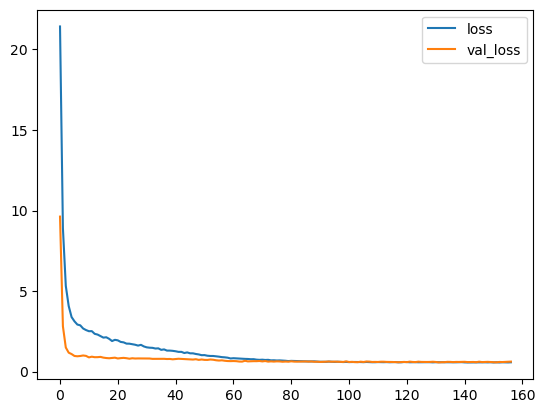

In [18]:
losses = pd.DataFrame(model.history.history)
losses.plot()

In [20]:
predictions = model.predict(X_test)

61/61 [==============================] - 0s 2ms/step


In [25]:
from sklearn.metrics import mean_absolute_error,mean_squared_error

In [26]:
mean_absolute_error(y_test,predictions)

0.624279341330895

In [27]:
np.sqrt(mean_squared_error(y_test,predictions))

0.790626896478076

In [30]:
wine_df['quality'].value_counts()

quality
6    2836
5    2138
7    1079
4     216
8     193
3      30
9       5
Name: count, dtype: int64

In [60]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical

# Splitting the data
X = wine_df.drop('quality', axis=1)
y = wine_df['quality']

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

# Preprocessing the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# One-hot encode the target variable
label_encoder = LabelEncoder()
y_train_encoded = to_categorical(label_encoder.fit_transform(y_train))
y_test_encoded = to_categorical(label_encoder.transform(y_test))

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

model = Sequential()
model.add(Dense(12, activation='relu', input_shape=(X_train.shape[1],)))

# Add more layers if needed
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))
model.add(Dense(12, activation='relu'))

# Output layer with softmax activation for multi-class classification
num_classes = len(label_encoder.classes_)
model.add(Dense(num_classes, activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

from tensorflow.keras.callbacks import EarlyStopping

early_stop = EarlyStopping(monitor='val_loss', mode='min', patience=25)

model.fit(x=X_train, y=y_train_encoded, epochs=600, validation_data=(X_test, y_test_encoded), verbose=1, callbacks=[early_stop])


Epoch 1/600
143/143 [==============================] - 9s 11ms/step - loss: 1.5036 - accuracy: 0.4352 - val_loss: 1.2783 - val_accuracy: 0.4287
Epoch 2/600
143/143 [==============================] - 1s 6ms/step - loss: 1.2841 - accuracy: 0.4399 - val_loss: 1.2664 - val_accuracy: 0.4287
Epoch 3/600
143/143 [==============================] - 1s 6ms/step - loss: 1.2709 - accuracy: 0.4361 - val_loss: 1.2461 - val_accuracy: 0.4287
Epoch 4/600
143/143 [==============================] - 1s 6ms/step - loss: 1.2464 - accuracy: 0.4396 - val_loss: 1.2201 - val_accuracy: 0.4569
Epoch 5/600
143/143 [==============================] - 1s 5ms/step - loss: 1.2168 - accuracy: 0.4561 - val_loss: 1.1899 - val_accuracy: 0.4487
Epoch 6/600
143/143 [==============================] - 1s 6ms/step - loss: 1.1883 - accuracy: 0.4777 - val_loss: 1.1545 - val_accuracy: 0.4815
Epoch 7/600
143/143 [==============================] - 1s 6ms/step - loss: 1.1492 - accuracy: 0.4955 - val_loss: 1.1290 - val_accuracy: 0.494

Epoch 58/600
143/143 [==============================] - 1s 5ms/step - loss: 0.9808 - accuracy: 0.5920 - val_loss: 1.0828 - val_accuracy: 0.5656
Epoch 59/600
143/143 [==============================] - 1s 6ms/step - loss: 0.9843 - accuracy: 0.5846 - val_loss: 1.0494 - val_accuracy: 0.5615
Epoch 60/600
143/143 [==============================] - 1s 5ms/step - loss: 0.9783 - accuracy: 0.5967 - val_loss: 1.0437 - val_accuracy: 0.5662
Epoch 61/600
143/143 [==============================] - 1s 5ms/step - loss: 0.9781 - accuracy: 0.5942 - val_loss: 1.0386 - val_accuracy: 0.5626
Epoch 62/600
143/143 [==============================] - 1s 6ms/step - loss: 0.9793 - accuracy: 0.5901 - val_loss: 1.0419 - val_accuracy: 0.5610
Epoch 63/600
143/143 [==============================] - 1s 5ms/step - loss: 0.9724 - accuracy: 0.6033 - val_loss: 1.0416 - val_accuracy: 0.5595
Epoch 64/600
143/143 [==============================] - 1s 5ms/step - loss: 0.9825 - accuracy: 0.5896 - val_loss: 1.0472 - val_accuracy:

In [61]:
from sklearn.metrics import classification_report
predictions = model.predict(X_test)
predicted_classes = label_encoder.inverse_transform(predictions.argmax(axis=1))
true_classes = label_encoder.inverse_transform(y_test_encoded.argmax(axis=1))

print(classification_report(true_classes, predicted_classes,zero_division=True))

61/61 [==============================] - 1s 3ms/step
              precision    recall  f1-score   support

           3       1.00      0.00      0.00        10
           4       1.00      0.00      0.00        58
           5       0.62      0.69      0.66       658
           6       0.56      0.55      0.55       836
           7       0.46      0.53      0.49       337
           8       1.00      0.00      0.00        49
           9       1.00      0.00      0.00         2

    accuracy                           0.56      1950
   macro avg       0.80      0.25      0.24      1950
weighted avg       0.59      0.56      0.54      1950

